# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of dog given the image of dog.

## 2. Data

The data we are using is from Kaggle Dog breed identification competition.

## 3. Evaluation

The evaluation is file with prediction probabilities for each dog breed of each test image.

## 4.Features

* We are dealing with images (unstructured data) so its best to use deep learning/ transfer learning.
* There are 120 breeds of dog (120 different classes).
* There are 10000+ images in both train and test set (these images have no labels,because we will want to predict them).

In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version", tf.__version__)
print("TF Hub Version", hub.__version__)

# Check for GPU Availability
print("GPU", "available (YESSS!!)" if tf.config.list_physical_devices("GPU") else "not available!")

TF Version 2.3.0
TF Hub Version 0.9.0
GPU available (YESSS!!)


## Getting our data ready (turning into tensors)

With all machine learning models, our data has to be in numerical form. So thats what we will be doing first. Turning our images into tensors(numerical representations).

Checking the labels first.

In [ ]:
import pandas as pd

labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     e2d770fe32772edb9dba937c009f3e4d  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


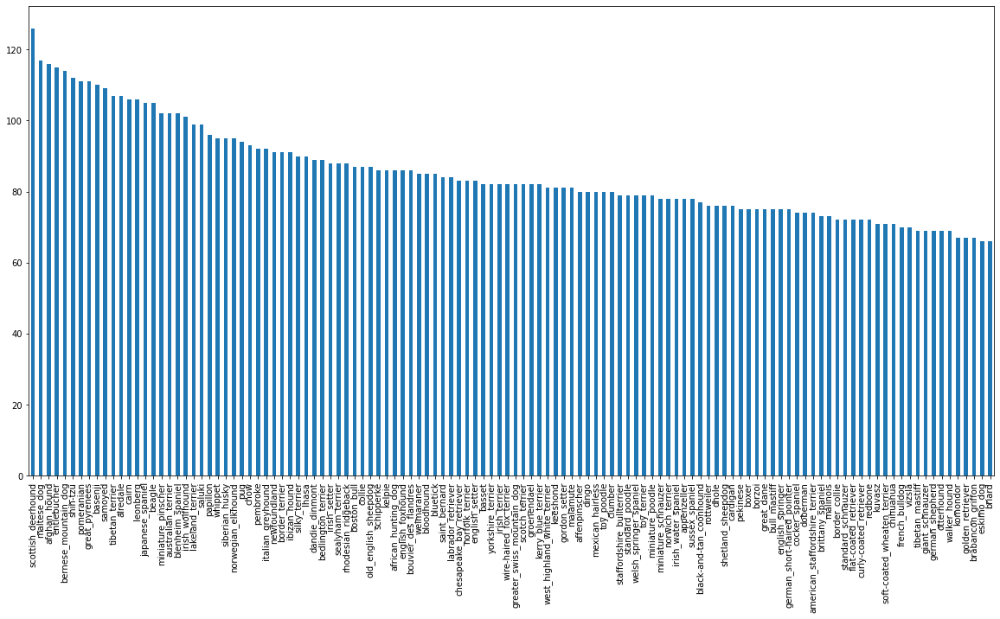

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

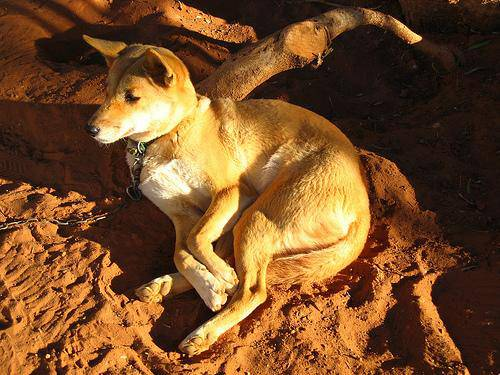

In [ ]:
# Viewing an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Lets get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ids
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether no of filenames matches numer of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames are equal to actual amount")
else:
  print("Filenames do not match the actual amt of files")

Filenames are equal to actual amount


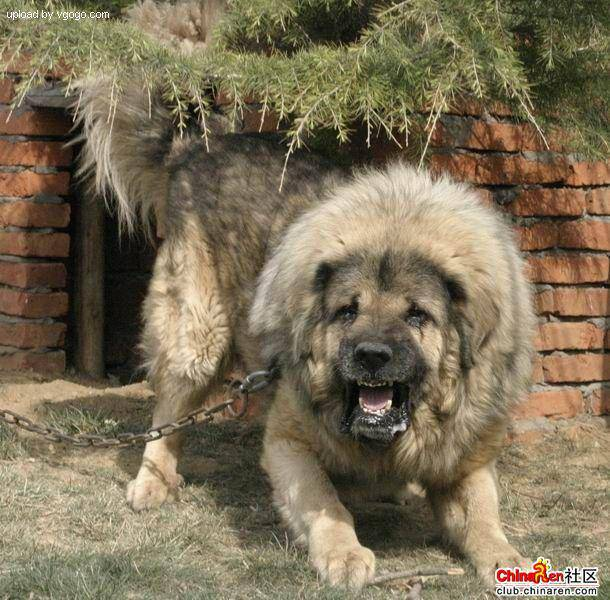

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have got our training image filepaths ready...lets prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
  print("Number of labels matches no of filenames")
else:
  print("Mismatch error")

Number of labels matches no of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # this is the index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where this sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set

Since our dataset from kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

# Splitting data into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=15)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# training data check
X_train[:3]

['drive/My Drive/Dog Vision/train/1083fffa8c174aa1a46627f53e1e50f8.jpg',
 'drive/My Drive/Dog Vision/train/0326344e0d5181130c28d25edd5627e4.jpg',
 'drive/My Drive/Dog Vision/train/007ff9a78eba2aebb558afea3a51c469.jpg']

In [ ]:
y_train[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False,  True, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Preprocessing images (turning images into tensors)

To preprocess our  images to tensors, we are writing a function:

1. take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable , 'image'
3. Turn our 'image' (a jpg) to Tensors
4. Normalise our image
5. Resize the image to be a shape of (224, 224)
6. Return the modified 'image'

In [ ]:
# Convert an image to a np array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
# turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [ ]:
# Define image size
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Turning our data into batches

If you process 10000 images in one go...they all might not fit into memory!

Thats why batch size is necessary...32 is the batch size

First convert our data in the form like this:
'(image,label)' like a tensor tuples

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Data converted into a tuple of tensors in the form: (image, label)... Lets make a function to turn all our data (X & y) into batches!..

In [ ]:
# Define batch size to 32
BATCH_SIZE = 32

# Function to create data into batches
def create_data_batches(X, y=None, batch_size= BATCH_SIZE, valid_data = False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if its training data, but doesn't shuffle if its validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset then we dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle it.
  elif valid_data:
    print("Creating validation data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) # filepaths and labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image) 
    data = data.map(get_image_label)
    # Turn data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val, valid_data=True)

Creating training data batches...
Creating validation data batches....


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualising Data Batches

Data is now in batches, however this can be hard to understand...let's visualise

In [ ]:
import matplotlib.pyplot as plt

# Create a function to viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and labels in a data batch.
  """
  plt.figure(figsize=(10, 10))
  # Loop through 25 images for displaying them
  for i in range(25):
    # Create subplots
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    # Add imagelabel as title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.3464292 , 0.36673734, 0.16231743],
          [0.44938415, 0.48355782, 0.24868387],
          [0.31886944, 0.36592826, 0.10738485],
          ...,
          [0.870299  , 0.900598  , 0.60645735],
          [0.62834764, 0.6379591 , 0.3155679 ],
          [0.7479366 , 0.73368704, 0.40601784]],
 
         [[0.35492513, 0.37462735, 0.17498812],
          [0.43954584, 0.4737195 , 0.24084136],
          [0.4602685 , 0.5073273 , 0.24885517],
          ...,
          [0.9214632 , 0.9447125 , 0.6588758 ],
          [0.6549603 , 0.6626222 , 0.35199568],
          [0.6939908 , 0.6890782 , 0.36536998]],
 
         [[0.42371702, 0.4416442 , 0.2523003 ],
          [0.44611722, 0.4816571 , 0.25735858],
          [0.5433411 , 0.5952112 , 0.33534414],
          ...,
          [0.6689242 , 0.6872435 , 0.4093199 ],
          [0.6434749 , 0.6553459 , 0.35126638],
          [0.7095944 , 0.71409994, 0.39929527]],
 
         ...,
 
         [[0.16316527, 0.24943979, 0.06904762],
          [0.16288

In [ ]:
len(train_images), len(train_labels)

(32, 32)

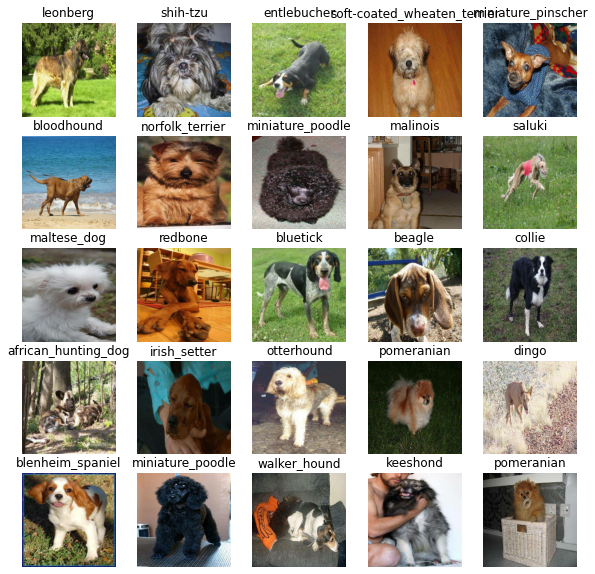

In [ ]:
# Visualise the data in a training batch
show_25_images(train_images, train_labels)

In [ ]:
# Lets visualise validation set
val_images, val_labels = next(val_data.as_numpy_iterator())

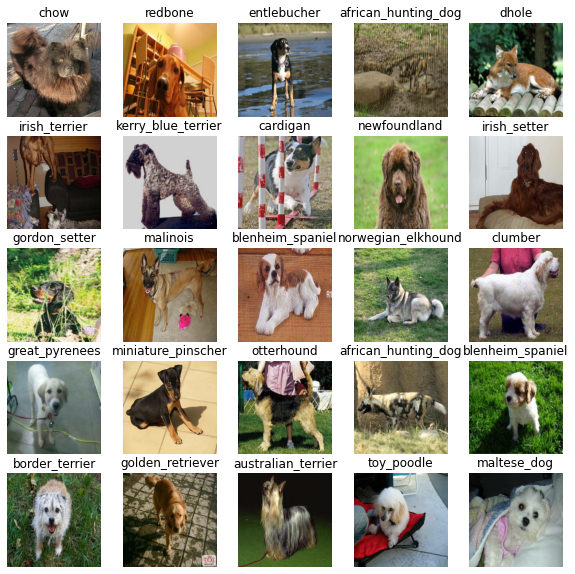

In [ ]:
show_25_images(val_images, val_labels)

## Building our model

Before building, there are few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub-
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch,height,width,color channels

# Setup the output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we have got our inputs and outputs and model ready to go. Lets put them to into a Keras deep learning model..

Lets create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

In [ ]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.
The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

### TensorBoard Callback
To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize the our models training logs using the %tensorboard magic function (we'll do this later on).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving.

In [ ]:
# Create Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we still running on gpu
print("GPU", "available YESS" if tf.config.list_physical_devices("GPU") else "NOt available")

GPU available YESS


Lets create a function which trains a model

* Create a model using 'create_model()'.
* Setup a TensorBoard Callback using 'create_tensorboard_callback()'.
* Call the fit function on our model passing it the training data, validation data, no of epochs to train for..which is NUM_EPOCHS and the callbacks we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 5.6810 - accuracy: 0.0312WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 565s 23s/step - loss: 4.5751 - accuracy: 0.0913 - val_loss: 3.3180 - val_accuracy: 0.3050
Epoch 2/100
25/25 [==============================] - 4s 141ms/step - loss: 1.6263 - accuracy: 0.6862 - val_loss: 2.0502 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 4s 147ms/step - loss: 0.5642 - accuracy: 0.9425 - val_loss: 1.5483 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 4s 148ms/step - loss: 0.2463 - accuracy: 0.9862 - val_loss: 1.3879 - val_accuracy: 0.6550
Epoch 5/100
25/25 [==============================] - 4s 147ms/step - loss: 0.1446 - accuracy: 0.9987 - val_loss: 1.3389 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 4s 147ms/step - loss: 0.0992 - accuracy: 1.0000 - val_loss: 1.2913 - val_accuracy: 0.6850
Epoch 7/100
25/25 [==============================] - 4s 149ms/step - loss: 0.0744 - accuracy: 1.0000 - val_loss: 1.2662 - val_accuracy: 0.6750
Epoch 8/100

### Checking the TensorBoard logs

The TensorBoard magic function ('%tensorboard') will access the log directory and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 100ms/step


array([[8.93231388e-03, 2.67193909e-03, 5.56011946e-05, ...,
        2.82820954e-04, 7.76934030e-06, 1.08900131e-03],
       [5.35827724e-07, 2.89896634e-05, 4.11728206e-06, ...,
        4.61254749e-05, 3.69179965e-04, 8.17420078e-05],
       [4.98139823e-04, 2.49154837e-04, 1.43432943e-03, ...,
        5.88682964e-02, 1.02879805e-03, 6.36094483e-05],
       ...,
       [8.98111437e-04, 1.12180460e-05, 1.14942035e-04, ...,
        9.51695110e-05, 2.64436530e-05, 5.30642865e-04],
       [2.92307604e-03, 1.41802477e-04, 1.81553114e-04, ...,
        9.58623423e-04, 2.80153996e-04, 5.35414787e-03],
       [1.70491135e-03, 2.73032929e-04, 1.58074293e-02, ...,
        4.80966922e-03, 1.11040298e-03, 1.83351367e-04]], dtype=float32)

In [ ]:
predictions[0]

array([8.93231388e-03, 2.67193909e-03, 5.56011946e-05, 1.03305350e-03,
       1.79531038e-04, 3.24184861e-04, 9.61040205e-05, 2.88933603e-04,
       1.57400442e-03, 7.69498183e-06, 8.18304034e-05, 1.03743258e-03,
       1.99813949e-05, 1.19906547e-03, 5.19686798e-03, 1.46024744e-04,
       2.07646939e-04, 7.24955753e-04, 4.23587408e-05, 2.19096139e-04,
       3.39925778e-03, 6.46444922e-03, 5.42893482e-04, 3.31587829e-02,
       5.03571879e-04, 1.67133042e-03, 3.24954337e-04, 8.37759071e-05,
       2.67555332e-03, 3.29277740e-04, 9.24818069e-02, 1.01262913e-03,
       1.28859992e-03, 9.52132919e-04, 3.38237405e-05, 1.95816756e-04,
       2.07405370e-02, 6.51795301e-04, 4.59972827e-04, 2.28674180e-05,
       1.81769647e-05, 1.97274087e-04, 1.68757499e-04, 2.48375756e-04,
       1.38012314e-04, 1.17352884e-02, 5.20471949e-04, 4.18863347e-04,
       1.26305269e-03, 7.87863901e-05, 9.32121256e-05, 1.54919908e-04,
       8.95777310e-04, 1.19780598e-03, 6.13683574e-02, 9.55157229e-05,
      

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# First Prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[8.93231388e-03 2.67193909e-03 5.56011946e-05 1.03305350e-03
 1.79531038e-04 3.24184861e-04 9.61040205e-05 2.88933603e-04
 1.57400442e-03 7.69498183e-06 8.18304034e-05 1.03743258e-03
 1.99813949e-05 1.19906547e-03 5.19686798e-03 1.46024744e-04
 2.07646939e-04 7.24955753e-04 4.23587408e-05 2.19096139e-04
 3.39925778e-03 6.46444922e-03 5.42893482e-04 3.31587829e-02
 5.03571879e-04 1.67133042e-03 3.24954337e-04 8.37759071e-05
 2.67555332e-03 3.29277740e-04 9.24818069e-02 1.01262913e-03
 1.28859992e-03 9.52132919e-04 3.38237405e-05 1.95816756e-04
 2.07405370e-02 6.51795301e-04 4.59972827e-04 2.28674180e-05
 1.81769647e-05 1.97274087e-04 1.68757499e-04 2.48375756e-04
 1.38012314e-04 1.17352884e-02 5.20471949e-04 4.18863347e-04
 1.26305269e-03 7.87863901e-05 9.32121256e-05 1.54919908e-04
 8.95777310e-04 1.19780598e-03 6.13683574e-02 9.55157229e-05
 1.16873451e-03 1.36813047e-04 2.78766025e-02 1.84785255e-04
 3.03385692e-04 4.73348300e-05 2.03344077e-02 1.51422562e-03
 1.70378014e-03 4.748996

Having the above functionality is great but we would want it to do it at scale.
And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilties are also known as confidence levels.

In [ ]:
# Turn predictions probabilties into their respective labels.
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[15])
pred_label

'great_pyrenees'

Since our val_data is batch dataset...lets unbatch it to make predictions on the images and comapre those predictions to validation labels

In [ ]:
# Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.13773258, 0.22346345, 0.11700305],
         [0.23252553, 0.30763057, 0.19563922],
         [0.18917102, 0.23913285, 0.12143797],
         ...,
         [0.62581116, 0.6604751 , 0.65875924],
         [0.51773745, 0.5334237 , 0.5451884 ],
         [0.52265537, 0.53834164, 0.55010635]],
 
        [[0.25052395, 0.3207971 , 0.23725367],
         [0.05130488, 0.10808291, 0.02970343],
         [0.12517099, 0.1568843 , 0.06729877],
         ...,
         [0.54057753, 0.5637918 , 0.5656825 ],
         [0.5297618 , 0.54544806, 0.55721277],
         [0.4893205 , 0.5050068 , 0.5167715 ]],
 
        [[0.37000483, 0.41180843, 0.35321406],
         [0.24726026, 0.27108258, 0.21825583],
         [0.2645443 , 0.27110162, 0.22206265],
         ...,
         [0.5270998 , 0.54968387, 0.55188966],
         [0.50706005, 0.5227463 , 0.534511  ],
         [0.51150376, 0.52719   , 0.53895473]],
 
        ...,
 
        [[0.33149698, 0.3085978 , 0.31612584],
         [0.35751867, 0.3346195 , 0.34214

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.13773258, 0.22346345, 0.11700305],
         [0.23252553, 0.30763057, 0.19563922],
         [0.18917102, 0.23913285, 0.12143797],
         ...,
         [0.62581116, 0.6604751 , 0.65875924],
         [0.51773745, 0.5334237 , 0.5451884 ],
         [0.52265537, 0.53834164, 0.55010635]],
 
        [[0.25052395, 0.3207971 , 0.23725367],
         [0.05130488, 0.10808291, 0.02970343],
         [0.12517099, 0.1568843 , 0.06729877],
         ...,
         [0.54057753, 0.5637918 , 0.5656825 ],
         [0.5297618 , 0.54544806, 0.55721277],
         [0.4893205 , 0.5050068 , 0.5167715 ]],
 
        [[0.37000483, 0.41180843, 0.35321406],
         [0.24726026, 0.27108258, 0.21825583],
         [0.2645443 , 0.27110162, 0.22206265],
         ...,
         [0.5270998 , 0.54968387, 0.55188966],
         [0.50706005, 0.5227463 , 0.534511  ],
         [0.51150376, 0.52719   , 0.53895473]],
 
        ...,
 
        [[0.33149698, 0.3085978 , 0.31612584],
         [0.35751867, 0.3346195 , 0.34214

In [ ]:
get_pred_label(labels_[15])

'great_pyrenees'

In [ ]:
get_pred_label(predictions[15])

'great_pyrenees'

Now we have :

* Prediction labels
* Validation labels (truth labels)
* Validation images

Lets visualize some model predictions

Create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilties to a predicted label.
* Plot the predicted label,its predicted probabiltiy,the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction,ground truth and the image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of title depending on the prediction
  if pred_label == true_label:
    color = "green"
  else:
    color="red"

  # Change the plot title to be predicted,probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

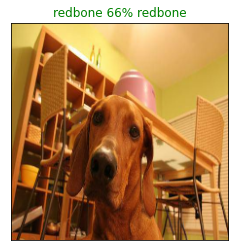

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=1)

Function built to visualise our model predictions....Lets make function to view model's top 10 predictions.

The function will:
* Take an input of prediction_probabilties array and a ground truth and an integer
* Find prediction using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilties indexes
  * Prediction probabilities values
  * Prediction probabilties labels
* Plot the top 10 prediction probabilities values and labels

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence value
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 predicted labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels,rotation="vertical")

  # Change color
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

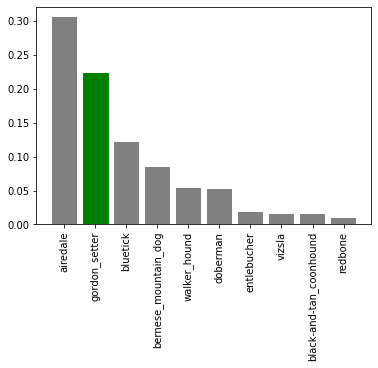

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=10)

Now we have some functions to hepl us visualize...lets check out a few!

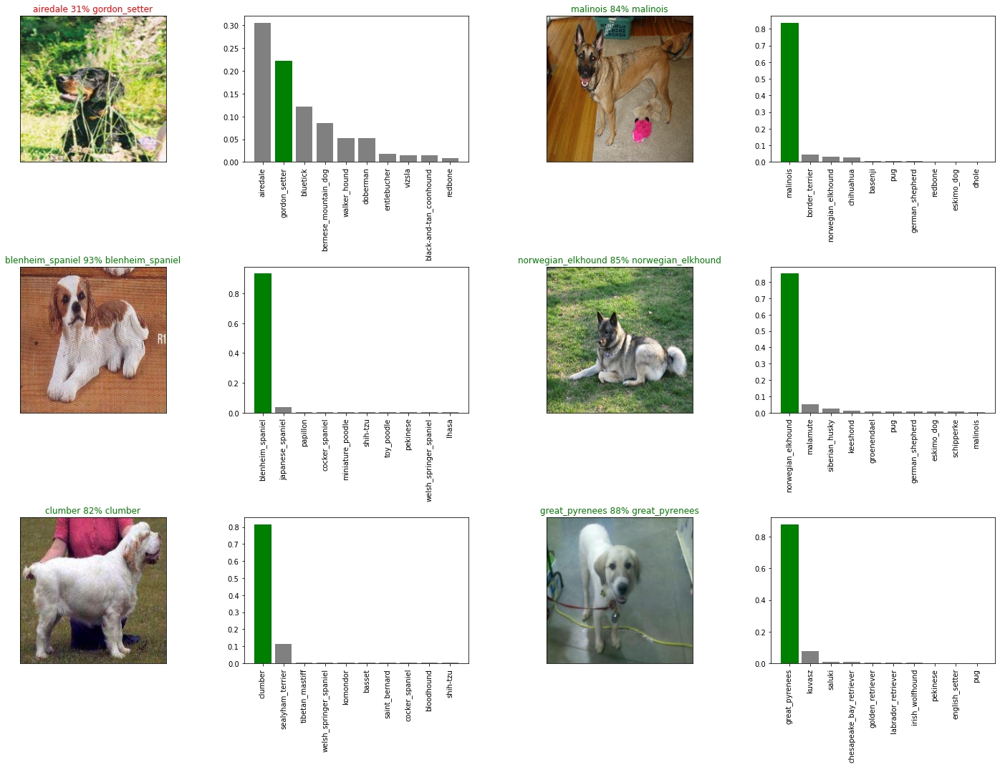

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows* num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Save a given model in models directory and appends a suffix(string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Creata a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saving load model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Lets check the functions of saving and loading

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20200829-10561598698609-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20200829-10561598698609-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/models/20200828-14141598624090-1000-images-mobilenetv2-Adam.h5')

Loading saving load model from: drive/My Drive/Dog Vision/models/20200828-14141598624090-1000-images-mobilenetv2-Adam.h5


## Training a Big DOG Model (on the full data)

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data,so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

**Note:** Running the cell below will take a little while (upto 30 mins for the first epoch) because the GPU we're using will have to load all images.

In [ ]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 5782s 18s/step - loss: 1.3250 - accuracy: 0.6696
Epoch 2/100
320/320 [==============================] - 36s 112ms/step - loss: 0.3997 - accuracy: 0.8812
Epoch 3/100
320/320 [==============================] - 36s 111ms/step - loss: 0.2337 - accuracy: 0.9349
Epoch 4/100
320/320 [==============================] - 36s 112ms/step - loss: 0.1541 - accuracy: 0.9622
Epoch 5/100
320/320 [==============================] - 36s 111ms/step - loss: 0.1053 - accuracy: 0.9802
Epoch 6/100
320/320 [==============================] - 35s 111ms/step - loss: 0.0773 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0587 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0455 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0382 - accuracy: 0.9953
Epoch 10/100
320/320 [==============================] - 36s 113m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20200829-12591598705954-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20200829-12591598705954-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20200829-12591598705954-full-image-set-mobilenetv2-Adam.h5')

Loading saving load model from: drive/My Drive/Dog Vision/models/20200829-12591598705954-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

To make predictions on the test data we have to get it into the same format.

To make predictions on the test data we'll:
* Get the test image filenames
* Convert the filenames into test data batches and setting the 'test data' parameter to True (since test data doesnt have labels)
* Make a predictions array by passing the test batches to the 'predict()' method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e9999f6b9a052810df4a5a762cb4cd1e.jpg',
 'drive/My Drive/Dog Vision/test/e8232c9a79f0e77e9b4c5fca60682d41.jpg',
 'drive/My Drive/Dog Vision/test/eceb457b878bc73e565b0efa002d5563.jpg',
 'drive/My Drive/Dog Vision/test/f1b634511c0ca2fcdf53c9c30f3358c9.jpg',
 'drive/My Drive/Dog Vision/test/e864985e40823a56d3ad8594066d0641.jpg',
 'drive/My Drive/Dog Vision/test/ecc4566304626790004cd2c3626218b6.jpg',
 'drive/My Drive/Dog Vision/test/edd7c1e04601546fc101901d764dc4b4.jpg',
 'drive/My Drive/Dog Vision/test/f58ce44146db339a0bba50bcecb02730.jpg',
 'drive/My Drive/Dog Vision/test/eddf1be0c12c7f3a5029a7787e89476f.jpg',
 'drive/My Drive/Dog Vision/test/f374a9d5a46f8b8aa97c715768f170d4.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling predict on our full model and passing it the test databatch will take lontime to run...about 1 hr..

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 6492s 20s/step


In [ ]:
# Save predictions (NumPy Array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[7.38496930e-10, 2.29553843e-09, 6.89576896e-10, ...,
        1.12704948e-08, 1.05915977e-10, 3.30240653e-12],
       [4.75245971e-12, 2.14962952e-07, 8.56990087e-12, ...,
        2.28516844e-10, 1.88893368e-09, 1.76425902e-10],
       [3.94657258e-11, 1.91288027e-11, 1.72804202e-10, ...,
        7.10353998e-11, 3.06541070e-10, 2.23483365e-09],
       ...,
       [3.08333324e-11, 6.30139718e-10, 2.88027935e-09, ...,
        2.19759277e-05, 1.98877692e-10, 3.38434192e-09],
       [1.27661011e-07, 1.44349838e-10, 1.16104393e-09, ...,
        3.07999581e-09, 1.57716556e-07, 7.46190271e-05],
       [5.62037861e-10, 1.36265305e-10, 2.12714535e-09, ...,
        5.30703710e-06, 1.01857859e-05, 1.86284037e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset for kaggle

Need an id columns with model's prediction probability outputs and column for each dog breed.

We will:
* Create a pandas Dataframe with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their file paths.
* Add data (the prediction probabilities) to each dog breed columns.
* Export the dataframe as CSV.

In [ ]:
# Create a DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e9999f6b9a052810df4a5a762cb4cd1e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e8232c9a79f0e77e9b4c5fca60682d41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,eceb457b878bc73e565b0efa002d5563,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f1b634511c0ca2fcdf53c9c30f3358c9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e864985e40823a56d3ad8594066d0641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e9999f6b9a052810df4a5a762cb4cd1e,7.38497e-10,2.29554e-09,6.89577e-10,8.03723e-09,1.52709e-08,2.0504e-09,2.19938e-10,6.45836e-11,3.47299e-08,1.25122e-07,4.61521e-07,3.62531e-07,1.02372e-08,3.72188e-08,6.54071e-08,6.41555e-09,5.64522e-07,5.26597e-11,2.02136e-05,7.54806e-11,1.0745e-10,7.29616e-10,3.28967e-11,1.65551e-07,7.47161e-06,5.90218e-06,1.07962e-11,4.54037e-10,0.000127086,1.2607e-11,5.24929e-07,1.03917e-06,3.65927e-08,8.26985e-09,6.38324e-07,2.69724e-08,3.05662e-08,6.45438e-08,1.3271e-08,...,3.07162e-10,1.53972e-09,2.69812e-06,2.16347e-07,1.70692e-10,2.05109e-08,1.69122e-09,9.24729e-11,1.08783e-08,3.88019e-09,3.83065e-08,3.87023e-07,0.00068776,4.83743e-08,2.56445e-07,2.24574e-11,4.77336e-09,6.42157e-08,1.02672e-09,1.30327e-07,1.53903e-08,8.12535e-09,1.08601e-10,3.92521e-09,3.26227e-10,2.61854e-06,4.12009e-10,1.5895e-07,1.6443e-05,3.26269e-08,1.51703e-10,2.5717e-10,4.35174e-11,2.7405e-06,1.37521e-07,9.37937e-09,2.80679e-09,1.12705e-08,1.05916e-10,3.30241e-12
1,e8232c9a79f0e77e9b4c5fca60682d41,4.75246e-12,2.14963e-07,8.5699e-12,1.07398e-07,6.12617e-13,3.89844e-12,1.27095e-12,4.02052e-13,3.37743e-08,1.78787e-10,1.06302e-08,4.78629e-12,5.6922e-06,1.91909e-10,0.999939,5.06857e-06,2.29345e-11,3.84563e-09,2.94475e-11,6.83345e-12,3.14042e-10,9.9228e-09,3.31102e-09,1.93642e-08,7.11808e-12,4.3059e-05,3.21317e-12,3.84046e-13,1.35851e-09,4.24745e-13,9.31888e-12,8.74489e-09,7.38361e-09,1.44876e-11,1.76592e-11,3.95432e-11,5.98327e-10,1.77862e-09,3.97196e-09,...,2.4481e-12,1.13241e-11,3.02619e-10,6.93669e-08,1.94197e-10,1.42108e-11,2.42807e-11,7.68737e-13,1.10125e-11,8.20712e-10,1.33727e-09,7.39207e-09,2.3059e-06,8.60289e-10,1.99808e-12,1.22265e-12,3.33543e-13,8.46719e-11,1.14801e-09,2.78338e-10,8.93646e-12,5.27952e-12,5.61695e-10,1.64729e-10,1.61208e-11,2.0471e-08,1.20881e-09,1.04262e-08,1.61743e-08,3.41828e-09,1.18641e-11,5.82372e-12,1.49234e-10,4.99741e-09,3.5407e-10,1.1328e-10,9.81116e-14,2.28517e-10,1.88893e-09,1.76426e-10
2,eceb457b878bc73e565b0efa002d5563,3.94657e-11,1.91288e-11,1.72804e-10,3.9503e-08,1.64324e-10,1.36052e-08,2.04175e-10,6.88618e-10,9.30273e-07,5.13917e-08,9.08964e-11,2.05266e-07,2.12933e-10,4.16602e-05,1.289e-09,5.72806e-11,4.81393e-11,2.0137e-10,9.14193e-10,1.39225e-10,1.67678e-11,5.92578e-11,3.19251e-10,7.49067e-10,0.000329247,3.57328e-09,8.69091e-09,5.09726e-10,7.1727e-09,1.49324e-09,4.90917e-10,4.00344e-07,3.52812e-07,1.09981e-08,3.57894e-11,2.55467e-10,3.86153e-08,6.40266e-11,2.06651e-10,...,1.8021e-10,1.40008e-10,7.36679e-10,1.80586e-08,1.96543e-07,9.63956e-11,2.68318e-10,3.04858e-10,8.89231e-12,4.12589e-11,3.26977e-11,5.18958e-12,2.61112e-06,1.30145e-09,8.68954e-10,2.19653e-10,1.38544e-09,3.27506e-10,4.59885e-13,2.5652e-08,7.31574e-09,1.25608e-08,1.08832e-08,3.59705e-09,2.69e-10,1.19472e-09,5.1422e-10,5.67126e-07,2.59372e-10,2.10512e-09,1.17498e-11,1.55029e-10,2.16813e-08,3.80312e-08,6.93627e-11,0.999576,1.20047e-08,7

In [ ]:
# Save our predictions to CSV
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_1_mobilnetv2.csv", index="False")

## Making predictions on our custom images

To make predictions on custom images we need:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using 'create_data_batches'. And since our custom images wont have labels we set the 'test_data' parameter to be 'True'.
* Pass the custom image data batch to our model's 'predict()' method.
* Convert the prediction output into labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get the filepaths
custom_path = 'drive/My Drive/Dog Vision/custom_dog_img/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/custom_dog_img/dog1.jfif',
 'drive/My Drive/Dog Vision/custom_dog_img/dog2.jfif',
 'drive/My Drive/Dog Vision/custom_dog_img/dog4.jfif',
 'drive/My Drive/Dog Vision/custom_dog_img/dog5.jfif',
 'drive/My Drive/Dog Vision/custom_dog_img/dog6.jfif',
 'drive/My Drive/Dog Vision/custom_dog_img/dog3.jfif']

In [ ]:
# Turn our custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on our data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds

array([[9.68477867e-11, 1.01823553e-05, 1.61177494e-09, 4.19260404e-09,
        1.17895832e-10, 1.24152619e-10, 1.06112841e-09, 5.94138558e-11,
        2.64029353e-07, 3.59950403e-11, 1.87260820e-08, 1.38767087e-08,
        2.00214913e-06, 8.07979532e-08, 6.47254637e-06, 2.34242421e-08,
        1.78479967e-10, 7.54830309e-10, 5.96083582e-09, 4.41795400e-09,
        2.06692358e-10, 3.69068442e-09, 3.21660498e-09, 2.88973947e-08,
        8.87815168e-06, 1.12073977e-07, 5.29414056e-12, 1.85494342e-09,
        3.09536190e-05, 7.20167870e-10, 1.23277601e-07, 1.34410413e-07,
        7.11202392e-06, 1.15112755e-06, 1.95202674e-07, 4.26722213e-09,
        2.83024395e-08, 8.27969582e-10, 3.21818627e-10, 1.28503871e-05,
        1.97388704e-06, 5.75350498e-07, 1.18872322e-06, 9.86349225e-09,
        1.13123644e-03, 1.64275571e-09, 1.64257397e-09, 1.29299034e-08,
        5.39064071e-10, 9.98254240e-01, 6.20828359e-06, 2.03383337e-08,
        2.88049460e-08, 2.89861446e-09, 8.70179573e-09, 6.593570

In [ ]:
custom_preds.shape

(6, 120)

In [ ]:
# Get the images predicted labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever',
 'golden_retriever',
 'toy_terrier',
 'labrador_retriever',
 'black-and-tan_coonhound',
 'golden_retriever']

In [ ]:
# Get custom predicted images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

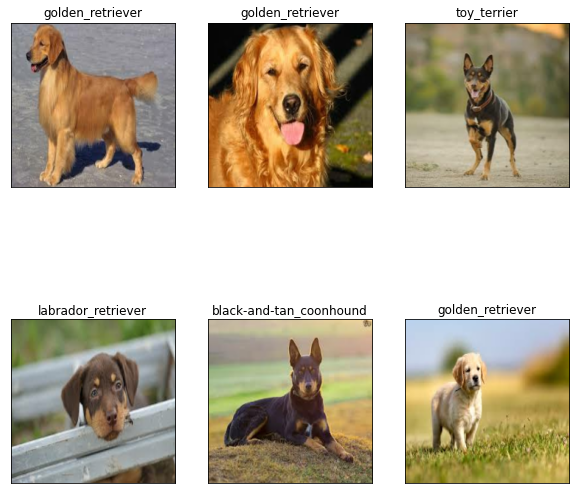

In [ ]:
# Check custom Images
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(2,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image) 